In [1]:
TRAIN = '/kaggle/input/natural-finger-counting-dataset-1-5/Natural Hand Digits Dataset'

We want to use image embeddings for both EDA and classification, so let's add some code to get image embeddings using ResNeXt without fine-tuning.

In [2]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import numpy as np


DEVICE = torch.device('cpu')
OUTPUT_SIZE = 2048

model = models.resnext50_32x4d(weights=models.ResNeXt50_32X4D_Weights.IMAGENET1K_V2)

extraction_layer = model._modules.get('avgpool')
model.to(DEVICE)
model.eval()

scaler = transforms.Resize((224, 224))
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
to_tensor = transforms.ToTensor()

def get_vec(arg, model, extraction_layer):
    image = normalize(to_tensor(scaler(arg))).unsqueeze(0).to(DEVICE)
    result = torch.zeros(1, OUTPUT_SIZE, 1, 1)
    def copy_data(m, i, o):
        result.copy_(o.data)
    hooked = extraction_layer.register_forward_hook(copy_data)
    with torch.no_grad():
        model(image)
    hooked.remove()
    return result

Downloading: "https://download.pytorch.org/models/resnext50_32x4d-1a0047aa.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-1a0047aa.pth
100%|██████████| 95.8M/95.8M [00:00<00:00, 152MB/s]


Let's load up our data. We're going to post-process the images to put all of the images in each digit class into the same image class.

In [3]:
import arrow
import base64
import pandas as pd
from glob import iglob
from io import BytesIO
from os.path import basename
from os.path import isdir
from PIL import Image

THUMBNAIL_SIZE = (96, 96)

def embed(model, filename: str):
    with Image.open(fp=filename, mode='r') as image:
        return get_vec(arg=image.convert('RGB'), model=model, extraction_layer=extraction_layer).numpy().reshape(OUTPUT_SIZE,)


# https://stackoverflow.com/a/952952
def flatten(arg):
    return [x for xs in arg for x in xs]

def png(filename: str) -> str:
    with Image.open(fp=filename, mode='r') as image:
        buffer = BytesIO()
        # our images are pretty big; let's shrink the hover images to thumbnail size
        image.resize(size=THUMBNAIL_SIZE).convert('RGB').save(buffer, format='png')
        return 'data:image/png;base64,' + base64.b64encode(buffer.getvalue()).decode()

def get_picture_from_glob(arg: str, tag: str,) -> list:
    time_get = arrow.now()
    result = [pd.Series(data=[tag, basename(input_file), embed(model=model, filename=input_file), png(filename=input_file)],
                        index=['tag', 'name', 'value', 'png'] )
        for index, input_file in enumerate(list(iglob(pathname=arg)))]
    print('encoded {} rows of {}  in {}'.format(len(result), tag, arrow.now() - time_get))
    return result

time_start = arrow.now()
train_dict = {basename(folder) : folder + '/*.*' for folder in iglob(TRAIN + '/*') if isdir(folder)}
train_df = pd.DataFrame(data=flatten(arg=[get_picture_from_glob(arg=value, tag=key) for key, value in train_dict.items()]))
train_df['tag'] = train_df['tag'].apply(func=lambda x: x.replace(' (1m)', '').replace(' (2m)', '').replace(' (50cm)', ''))
print('done in {}'.format(arrow.now() - time_start))

encoded 90 rows of Digit 1 (1m)  in 0:00:16.210331
encoded 90 rows of Digit 5 (2m)  in 0:00:15.849833
encoded 90 rows of Digit 1 (50cm)  in 0:00:15.997150
encoded 90 rows of Digit 3 (1m)  in 0:00:15.989822
encoded 90 rows of Digit 5 (50cm)  in 0:00:15.949075
encoded 90 rows of Digit 1 (2m)  in 0:00:15.847526
encoded 90 rows of Digit 5 (1m)  in 0:00:15.605097
encoded 90 rows of Digit 2 (1m)  in 0:00:15.579044
encoded 90 rows of Digit 2 (2m)  in 0:00:15.760466
encoded 90 rows of Digit 2 (50cm)  in 0:00:15.790039
encoded 90 rows of Digit 3 (2m)  in 0:00:16.066603
encoded 90 rows of Digit 3 (50cm)  in 0:00:15.967552
encoded 90 rows of Digit 4 (1m)  in 0:00:15.852484
encoded 90 rows of Digit 4 (50cm)  in 0:00:15.787299
encoded 90 rows of Digit 4 (2m)  in 0:00:15.817597
done in 0:03:58.181223


Our classes are balanced.

In [4]:
train_df['tag'].value_counts(normalize=True).to_frame().T

tag,Digit 1,Digit 5,Digit 3,Digit 2,Digit 4
proportion,0.2,0.2,0.2,0.2,0.2


Let's use TSNE to add x/y coordinates based on the image embeddings, so we can make a scatter plot.

In [5]:
from sklearn.manifold import TSNE

train_reducer = TSNE(random_state=2025, verbose=True, n_jobs=1, perplexity=20.0, init='pca')
train_df[['x', 'y']] = train_reducer.fit_transform(X=train_df['value'].apply(func=pd.Series))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1350 samples in 0.010s...
[t-SNE] Computed neighbors for 1350 samples in 0.275s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1350
[t-SNE] Computed conditional probabilities for sample 1350 / 1350
[t-SNE] Mean sigma: 3.029323
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.526489
[t-SNE] KL divergence after 1000 iterations: 0.460711


Let's plot.

In [6]:
from bokeh.models import ColumnDataSource
from bokeh.models import HoverTool

from bokeh.plotting import figure
from bokeh.plotting import output_notebook
from bokeh.plotting import show
from bokeh.palettes import Turbo256
from bokeh.transform import factor_cmap

output_notebook()

datasource = ColumnDataSource(train_df[['png', 'tag', 'x', 'y']].sample(n=min(len(train_df) - 1, 10000)))
factor_count = max(train_df['tag'].nunique(), 3)
indices = np.linspace(0, len(Turbo256)-1, factor_count, dtype=int)
palette = [Turbo256[index] for index in indices]
mapper = factor_cmap(field_name = 'tag', palette=palette, factors=train_df['tag'].unique().tolist(), start=0, end=factor_count-1, )

plot_figure = figure(title='TSNE projection: digits 1 through 5', width=1000, height=800, tools=('pan, wheel_zoom, reset'))

plot_figure.add_tools(HoverTool(tooltips="""
<div>
    <div>
        <img src='@png' style='float: left; margin: 5px 5px 5px 5px'/>
    </div>
    <div>
        <span style='font-size: 18px'>@tag</span>
    </div>
</div>
"""))

plot_figure.scatter(x='x', y='y', source=datasource, line_alpha=0.6, fill_alpha=0.6, size=8, color=mapper)
show(plot_figure)

Loading BokehJS ...

Our clusters are kind of a mess; it looks like the image embeddings have more information about the image setting than they do about the class. Let's build a model and see what we get.

In [7]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(train_df['value'].apply(pd.Series), train_df['tag'], test_size=0.25, random_state=2025, stratify=train_df['tag'])
logreg = LogisticRegression(max_iter=10000, tol=1e-12).fit(X_train, y_train)
print('model fit in {} iterations'.format(logreg.n_iter_[0]))
print('accuracy: {:5.4f}'.format(accuracy_score(y_true=y_test, y_pred=logreg.predict(X=X_test))))
print('f1: {:5.4f}'.format(f1_score(average='weighted', y_true=y_test, y_pred=logreg.predict(X=X_test))))
print(classification_report(y_true=y_test, y_pred=logreg.predict(X=X_test), zero_division=0.0))

model fit in 1024 iterations
accuracy: 0.8964
f1: 0.8949
              precision    recall  f1-score   support

     Digit 1       0.96      0.96      0.96        68
     Digit 2       0.85      0.96      0.90        67
     Digit 3       0.89      0.84      0.86        68
     Digit 4       0.93      0.76      0.84        67
     Digit 5       0.87      0.97      0.92        68

    accuracy                           0.90       338
   macro avg       0.90      0.90      0.89       338
weighted avg       0.90      0.90      0.89       338



Honestly an f1 of almost 0.9 is surprisingly good; the model takes forever to fit, but once it's done it does a good job. Let's have a look at our model probabilities.

<Axes: xlabel='probability', ylabel='Count'>

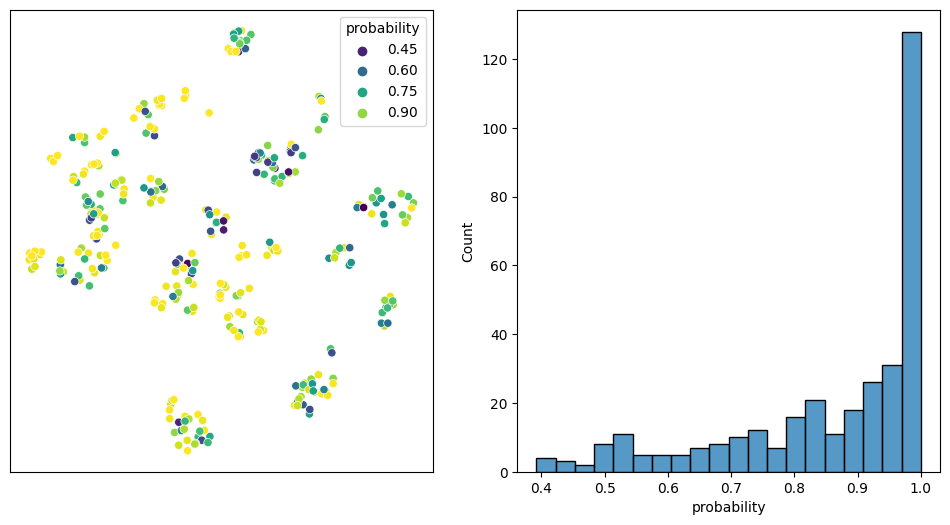

In [8]:
import matplotlib.pyplot as plt
import warnings
from seaborn import histplot
from seaborn import scatterplot

warnings.filterwarnings('ignore', category=FutureWarning, module='seaborn')

plot_df = train_df.iloc[X_test.index][['x', 'y']].copy()
plot_df['probability'] = np.max(logreg.predict_proba(X=X_test), axis=1)

plt, ax = plt.subplots(ncols=2, figsize=(12, 6))
scatterplot(ax=ax[0], data=plot_df, x='x', y='y', hue='probability', palette='viridis', )
ax[0].set(xlabel=None) 
ax[0].set(ylabel=None)
ax[0].set(xticklabels=[])
ax[0].set(yticklabels=[])
ax[0].tick_params(axis='both', which='both', length=0)
histplot(ax=ax[1], data=plot_df, x='probability', bins=20)

The model probabilities reflect the divergence between the classes and the clusters we see above. In all likelihood our high model accuracy is due more to essentially the same image being in both the training and test splits than it does correctly modeling the classes.